# Вспомогательный код

Установка необходимых библиотек:

In [1]:
!pip install -q torchmetrics[image]
!pip install -q lightning tbparse

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 34.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 31.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 32.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 109.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 962.5/962.5 kB 57.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 819.0/819.0 kB 52.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

Зафиксируем начальные значения генераторов случайных чисел для воспроизводимости результатов:

In [2]:
import os
import torch
import random
import numpy as np
import lightning as L


# basic random seed
def seed_basic(seed=42):
    random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    np.random.seed(seed)


# torch random seed
def seed_torch(seed=42):
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False


# basic + torch + lightning
def seed_everything(seed=42):
    seed_basic(seed)
    seed_torch(seed)
    L.seed_everything(seed)


seed_everything()

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


# Задание 1. GAN для генерации точек

В этом задании вам предлагается попрактиковаться в обучении генеративно-состязательных нейронных сетей на простом примере генерации точек на плоскости.

В лекции был рассмотрен пример генерации точек, лежащих на параболе, при **нормальном** входном распределении $Z$. В задании требуется провести эксперимент с генерацией точек на параболе при **равномерном** входном распределении $Z$.

Далее в качестве дополнительного задания предлагается реализовать генерацию точек на плоскости, образующих какую-либо другую фигуру (например, круг или спираль).

## Формат результата

1. Результаты экспериментов с изменением распределения входного латентного пространства и вывод по ним.
2. *Дополнительно: модель, обученная для генерации выбранной вами фигуры, например, круга.

Пример генерации:

<img src ="https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.4/Exercises/EX13/result_1_task_ex13.png" width="1000">

Импорт необходимых библиотек:

In [3]:
import torch
import numpy as np
import pandas as pd
import seaborn as sns
import torch.nn as nn
import lightning as L
import matplotlib.pyplot as plt

from tbparse import SummaryReader
from torch.utils.data import Dataset, DataLoader
from IPython.display import clear_output

##  Модели генератора и дискриминатора

Определяем модели генератора и дискриминатора:

In [4]:
class Generator(nn.Module):
    def __init__(self, latent_space, hidden_dim):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(latent_space, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, 2),
        )  # x,y

    def forward(self, x):
        return self.model(x)


class Discriminator(nn.Module):
    def __init__(self, hidden_dim):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(2, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, 1),  # real/fake
            nn.Sigmoid(),
        )

    def forward(self, x):
        return self.model(x)

## Датасет

Создадим датасет, который при инициализации генерирует точки параболы:

In [ ]:
class ParabolaDataset(Dataset):
    def __init__(self, n_samples=1000, noise=0.0):
        self.n_samples = n_samples
        self.noise = noise
        self.x = torch.FloatTensor(np.random.uniform(-1, 1, size=(n_samples)))
        self.y = torch.pow(self.x, 2) + torch.randn(n_samples) * noise

    def __len__(self):
        return self.n_samples

    def __getitem__(self, idx):
        return torch.stack((self.x[idx], self.y[idx]), 0), 0

Сгенерируем точки, посмотрим на них:

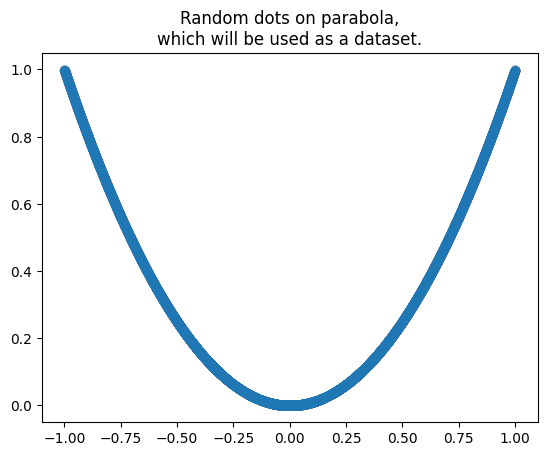

In [ ]:
parabola = ParabolaDataset(n_samples=100000, noise=0)
plt.scatter(parabola.x, parabola.y, alpha=0.01)
plt.title("Random dots on parabola,\nwhich will be used as a dataset.")
plt.show()

## Код обучения

Возьмем код визуализации из лекции:

In [5]:
def test_image(pair_gen, pairs, figsize=(12, 3)):
    # Equalizing lengths for better visualization
    if len(pair_gen) > len(pairs):
        pair_gen = pair_gen[: len(pairs)]
    else:
        pairs = pairs[: len(pair_gen)]

    df = pd.DataFrame(data=np.concatenate([pairs, pair_gen]), columns=["x", "y"])
    df["label"] = ["real"] * len(pairs) + ["generated"] * len(pair_gen)

    plot = sns.jointplot(data=df, x="x", y="y", hue="label")
    sns.move_legend(plot.ax_joint, "lower left")
    if figsize:
        plot.fig.set_size_inches(figsize)
    plt.axis([-1.1, 1.1, -0.1, 1.1])
    plt.grid()
    plt.show()


def tbparse_visual(log_dir, figsize=(12, 3)):
    # Visualization without TensorBoard for TensorBoard logs
    clear_output()
    reader = SummaryReader(log_dir)
    df = reader.scalars

    plt.figure(figsize=figsize)
    for tag in df.tag.unique():
        if "loss" in tag:
            tag_data = df.query("`tag` == @tag").sort_values(by="step")
            plt.plot(tag_data.step, tag_data.value, label=tag)
    plt.xlabel("step")
    plt.ylabel("loss")
    plt.legend(loc="lower left")
    plt.grid()
    plt.show()

Код обучения модели:

In [6]:
class GAN(L.LightningModule):
    def __init__(
        self,
        generator,
        discriminator,
        lr=3e-4,
        betas=(0.9, 0.999),
        noise_function=torch.randn,
        latent_dim=5,
    ):
        super().__init__()
        self.automatic_optimization = False  # for handmade settings

        self.generator = generator
        self.discriminator = discriminator
        self.criterion = nn.BCELoss()
        self.lr = lr
        self.betas = betas
        self.noise_function = noise_function
        self.latent_dim = latent_dim

    def configure_optimizers(self):
        opt_gen = torch.optim.Adam(
            self.generator.parameters(),
            lr=self.lr,
            betas=self.betas,
        )
        opt_disc = torch.optim.Adam(
            self.discriminator.parameters(),
            lr=self.lr,
            betas=self.betas,
        )
        return [opt_gen, opt_disc], []

    def training_step(self, batch, batch_idx):
        self.real_items, _ = batch
        noises = self.noise_function(
            (self.real_items.shape[0], self.latent_dim),
            dtype=torch.float32,
        ).to(self.device)

        opt_gen, opt_disc = self.optimizers()

        real_label = torch.full(
            size=(self.real_items.shape[0], 1),
            fill_value=1,  # 1 == real, 0 == fake
            dtype=torch.float,
        ).to(self.device)

        fake_label = torch.full(
            size=(self.real_items.shape[0], 1),
            fill_value=0,  # 1 == real, 0 == fake
            dtype=torch.float,
        ).to(self.device)
        # ---------------------
        # Train discriminator
        # ---------------------
        self.discriminator.zero_grad()
        # 1. discriminator on real items
        disc_label = self.discriminator(self.real_items)
        loss_disc_real = self.criterion(disc_label, real_label)
        loss_disc_real.backward()

        # 2. discriminator on fake items
        with torch.no_grad():  # don't calculate the gradient for generator
            self.fake_items = self.generator(noises)
        disc_label = self.discriminator(self.fake_items)
        loss_disc_fake = self.criterion(disc_label, fake_label)
        loss_disc_fake.backward()

        # 3. discriminator optimizer step (on real and fake items)
        opt_disc.step()
        loss_disc = 0.5 * loss_disc_real + 0.5 * loss_disc_fake
        self.log("loss/disc", loss_disc, on_epoch=False, on_step=True)

        # ---------------------
        # Train generator
        # ---------------------
        self.generator.zero_grad()
        self.fake_items = self.generator(noises)
        disc_label = self.discriminator(self.fake_items)
        loss_gen = self.criterion(disc_label, real_label)
        loss_gen.backward()

        opt_gen.step()
        self.log("loss/gen", loss_gen, on_epoch=False, on_step=True)

        if (batch_idx + 1) % 1000 == 0:
            tbparse_visual(self.logger.log_dir)
            test_image(
                self.fake_items.detach().cpu().numpy(),
                self.real_items.detach().cpu().numpy(),
                figsize=(12, 3.5),
            )

    def on_train_epoch_end(self):
        tbparse_visual(self.logger.log_dir)
        test_image(
            self.fake_items.detach().cpu().numpy(),
            self.real_items.detach().cpu().numpy(),
            figsize=(12, 3.5),
        )

## Изменение входного распределения

У Lightning-модуля GAN, данного выше, есть атрибут `noise_function`, который задает функцию, с помощью которой будут семплироваться случайные входные вектора. По умолчанию используется нормальное распределение `torch.randn`.

In [ ]:
latent_dim = 5
batch_size = 32
hidden_dim = 50
epochs = 4

train_loader = DataLoader(parabola, batch_size=batch_size, shuffle=True, num_workers=2)

seed_everything()
generator = Generator(latent_dim, hidden_dim=hidden_dim)
discriminator = Discriminator(hidden_dim=hidden_dim)

pl_model = GAN(
    generator, discriminator, latent_dim=latent_dim, noise_function=torch.randn
)

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


Обучите GAN
(менять ничего не надо):

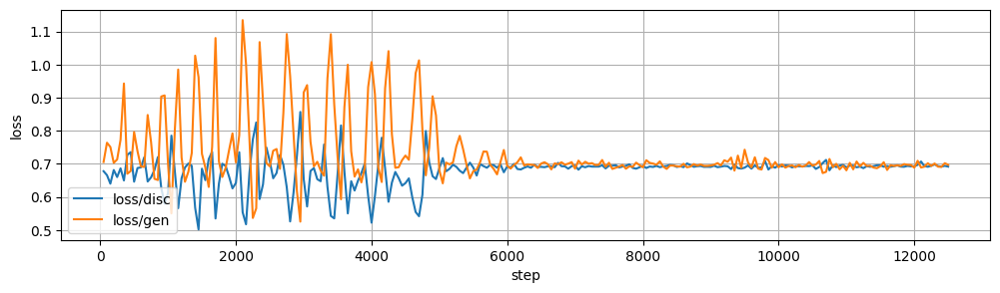

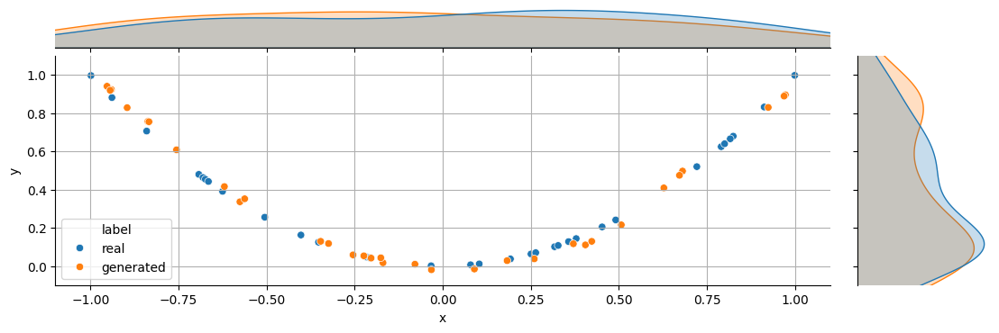

INFO: `Trainer.fit` stopped: `max_epochs=4` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=4` reached.


In [ ]:
trainer = L.Trainer(
    max_epochs=epochs,
    logger=L.pytorch.loggers.TensorBoardLogger(save_dir="./z1/parabola/gaus/"),
)

trainer.fit(model=pl_model, train_dataloaders=train_loader)

Попробуйте поменять распределение входного латентного пространства на **равномерное** и обучить модель.

**Совет:** Не забудьте заново инициализировать модели перед обучением.


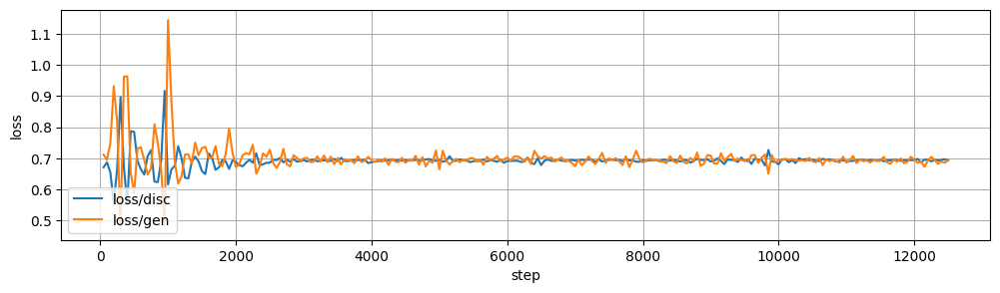

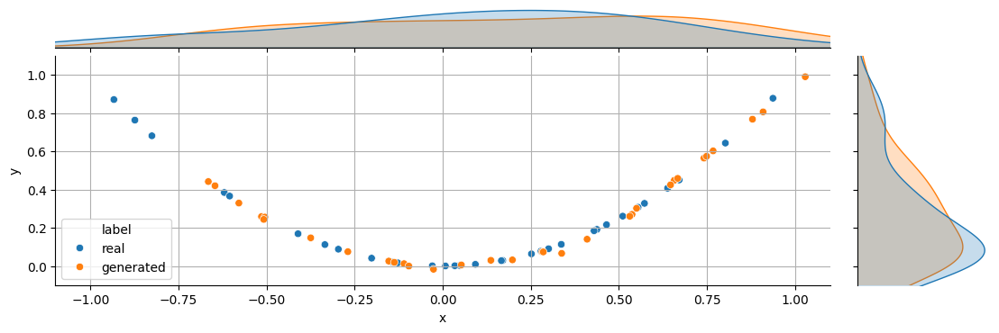

INFO: `Trainer.fit` stopped: `max_epochs=4` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=4` reached.


In [ ]:
generator = Generator(latent_dim, hidden_dim=hidden_dim)
discriminator = Discriminator(hidden_dim=hidden_dim)

noise_function_uniform = lambda *size,**kwargs: 2 * torch.rand(*size, **kwargs) - 1

pl_model = GAN(
    generator, discriminator, latent_dim=latent_dim, noise_function=noise_function_uniform
)
trainer = L.Trainer(
    max_epochs=epochs,
    logger=L.pytorch.loggers.TensorBoardLogger(save_dir="./z1/parabola/uniform/"),
)

trainer.fit(model=pl_model, train_dataloaders=train_loader)

Напишите вывод о зависимости генерации от входного распределения.

**Вывод:**

При инициализации равномерного распределения шума на участе от -1 до 1 (области для параболы) видно, что генератор и дискриминатор сходятся раньше, чем при нормальном распределении. **add something here**

## *Дополнительно: Изменение генерируемых данных

Сделайте генерацию фигуры более сложной формы (например, круга).

In [ ]:
class CircleDataset(Dataset):
    def __init__(self, n_samples=1000, noise=0.0,radius = 0.5):
        self.n_samples = n_samples
        self.noise = noise
        self.x = torch.FloatTensor(np.random.uniform(-radius, radius, size=(n_samples)))
        sign = 2*torch.randint(0, 2,self.x.shape, dtype=torch.float32) - 1

        self.y = sign*torch.sqrt(radius**2-torch.pow(self.x, 2)) + torch.randn(n_samples) * noise + radius

    def __len__(self):
        return self.n_samples

    def __getitem__(self, idx):
        return torch.stack((self.x[idx], self.y[idx]), 0), 0

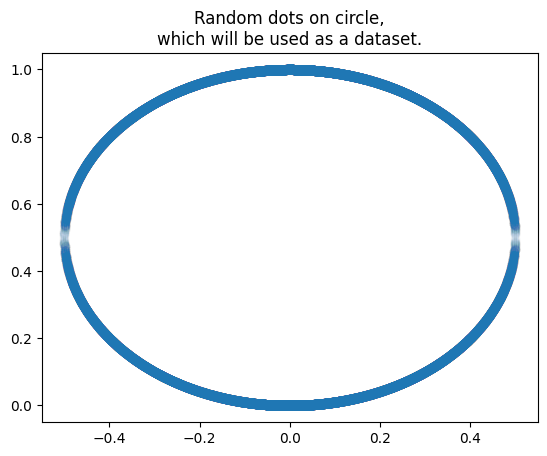

In [ ]:
circle = CircleDataset(n_samples=100000, noise=0)
plt.scatter(circle.x, circle.y, alpha=0.01)
plt.title("Random dots on circle,\nwhich will be used as a dataset.")
plt.show()

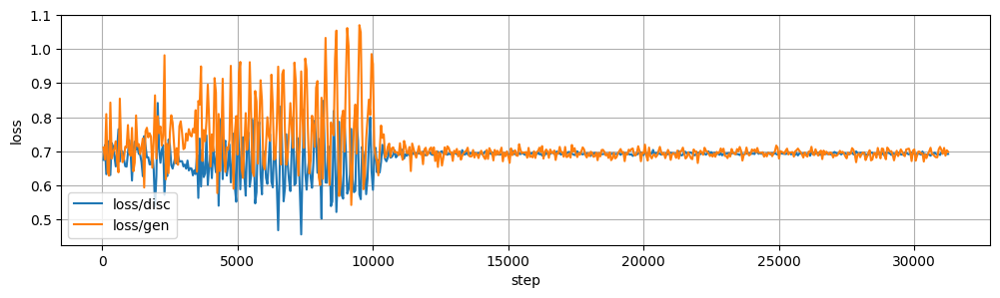

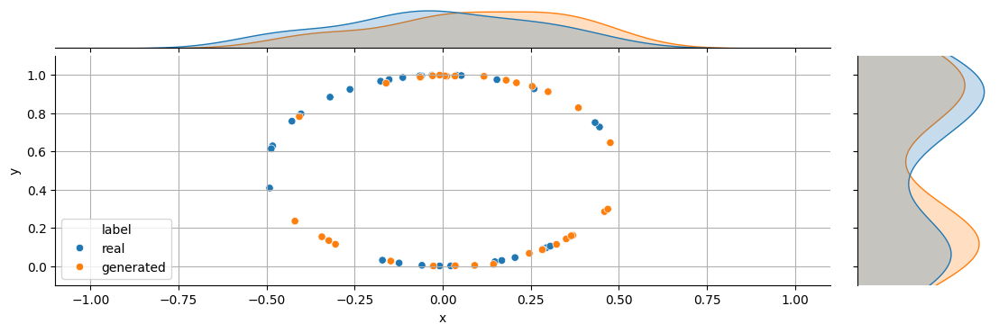

INFO: `Trainer.fit` stopped: `max_epochs=10` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


In [ ]:
train_loader = DataLoader(circle, batch_size=batch_size, shuffle=True, num_workers=2)

seed_everything()
generator = Generator(latent_dim, hidden_dim=hidden_dim)
discriminator = Discriminator(hidden_dim=hidden_dim)

pl_model = GAN(
    generator, discriminator, latent_dim=latent_dim, noise_function=torch.randn
)
trainer = L.Trainer(
    max_epochs=10,
    logger=L.pytorch.loggers.TensorBoardLogger(save_dir="./z1/circle/gaus/"),
)

trainer.fit(model=pl_model, train_dataloaders=train_loader)

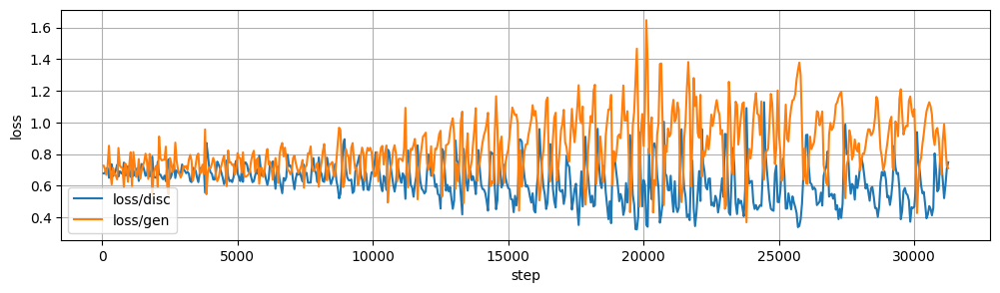

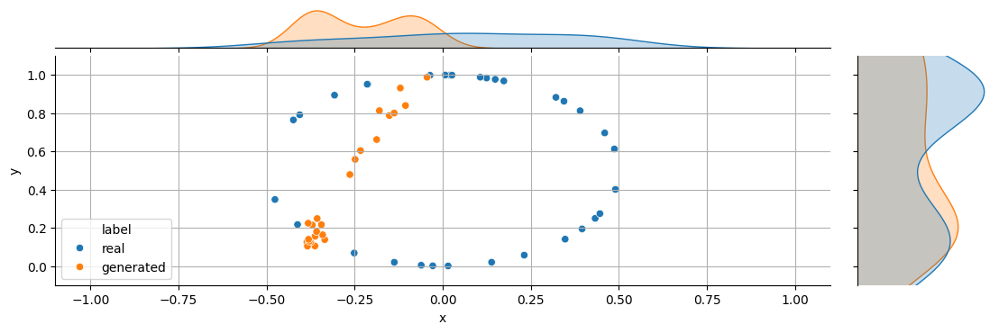

INFO: `Trainer.fit` stopped: `max_epochs=10` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


In [ ]:
generator = Generator(latent_dim, hidden_dim=hidden_dim)
discriminator = Discriminator(hidden_dim=hidden_dim)

noise_function_uniform = lambda *size,**kwargs: 2 * torch.rand(*size, **kwargs) - 1

pl_model = GAN(
    generator, discriminator, latent_dim=latent_dim, noise_function=noise_function_uniform
)
trainer = L.Trainer(
    max_epochs=10,
    logger=L.pytorch.loggers.TensorBoardLogger(save_dir="./z1/circle/uniform/"),
)

trainer.fit(model=pl_model, train_dataloaders=train_loader)

В случае же с кругом лучше сработала генерация шума нормальным распределением, а не равномерным. Для равномерного шума генератор и дискриминатор разошлись.

# Задание 2. This Galaxy doesn't exist (Conditional GAN)

В этом задании мы используем Conditional GAN для того, чтобы создавать изображения галактик, которых никогда не существовало. Для этого воспользуемся датасетом [Galaxy10 DECals 🛠️[doc]](https://astronn.readthedocs.io/en/latest/galaxy10.html), содержащим 17736 центрированных цветных (RGB) изображений галактик с размерами 256×256, разделенных на 10 классов.

В задании будет использоваться уменьшенная версия датасета для экономии памяти. В ней изображения и их порядок соответствуют оригинальному датасету, но размеры изображений уменьшены до 64×64.

Выбор архитектуры генератора и дискриминатора — ресурсоемкая задача, поэтому этот код за вас написан. Ваша задача — дописать код обучения Conditional GAN и получить реалистичные изображения, а также оценить качество генерации по метрике Inception Score.

## Формат результата

- Сгенерированные изображения галактик
- Значения `InceptionScore`
- Вывод

Пример генерации:

<img src ="https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.4/Exercises/EX13/result_2_task_ex13.png" width="800">

Импорт необходимых библиотек:

In [7]:
import h5py
import torch
import numpy as np
import lightning as L
import matplotlib.pyplot as plt

from torchvision.transforms import v2
from torch import nn
from tqdm import tqdm
from tbparse import SummaryReader
from torchvision.utils import make_grid
from torch.nn.utils import spectral_norm
from torch.utils.data import Dataset, DataLoader, random_split
from sklearn.model_selection import train_test_split
from torchmetrics.image.inception import InceptionScore
from IPython.display import clear_output

## Датасет

In [8]:
!wget -qN https://edunet.kea.su/repo/EduNet-web_dependencies/datasets/Galaxy10_resized.zip
!unzip -qn Galaxy10_resized.zip

Датасет в архиве сохранен в формате [hdf5 🛠️[doc]](https://docs.h5py.org/en/stable/). В файле с датасетом по ключу `images` находится numpy-массив изображений размером `(17736, 64, 64, 3)`, по ключу `labels` — numpy-массив меток классов размером `(17736,)`, а по ключу `class_to_id` — словарь соответствия названия класса его номеру.

Напишем `Dataset` для загрузки данных и обращения с ними:

In [9]:
class GalaxyDataset(Dataset):
    def __init__(self, path, transform=None):
        super().__init__()
        self.transform = transform
        # reading data from h5 file
        with h5py.File(path, "r") as h5file:
            # reading images and labels arrays
            self.images = np.array(h5file["images"], dtype=np.uint8)
            self.labels = np.array(h5file["labels"])

            # reading class_to_id dict
            dict_group = h5file["class_to_id"]
            self.class_to_id = {key: dict_group.attrs[key] for key in dict_group.attrs}
        self.id_to_class = {v: k for k, v in self.class_to_id.items()}

    def __getitem__(self, idx):
        image = self.images[idx]
        label = torch.tensor(self.labels[idx])

        if self.transform:
            image = self.transform(image)

        return image, label

    def __len__(self):
        return len(self.images)

In [10]:
dataset = GalaxyDataset(
    path="Galaxy10_resized.h5",
    transform=v2.Compose(
        [
            v2.ToImage(),
            v2.ToDtype(torch.float32, scale=True),
        ]
    ),
)

В датасете Galaxy10 есть изображения 10 классов.

In [11]:
for i in range(len(dataset.id_to_class)):
    print(f"{i}: {dataset.id_to_class[i]}")

0: Disturbed
1: Merging
2: Round Smooth
3: Smooth, Cigar shaped
4: Cigar Shaped Smooth
5: Barred Spiral
6: Unbarred Tight Spiral
7: Unbarred Loose Spiral
8: Edge-on without Bulge
9: Edge-on with Bulge


 Выведем по одному изображению из каждого класса:

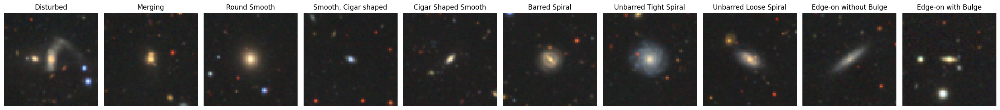

In [12]:
def show_samples(images, titles=[]):
    fig, ax = plt.subplots(nrows=1, ncols=len(images), figsize=(25, 15))
    for i, img in enumerate(images):
        ax[i].imshow(img)
        if len(titles) > i:
            ax[i].set_title(titles[i])
        ax[i].axis("off")
    plt.tight_layout()


# Get first image in class along with class index
class_num, first_indx = np.unique(dataset.labels, return_index=True)
real_samples = dataset.images[first_indx]
class_names = [dataset.id_to_class[id] for id in range(10)]
show_samples(real_samples, class_names)

### Разделение на train и test

In [13]:
train_size = int(len(dataset) * 0.9)
test_size = len(dataset) - train_size

print(f"Train set size: {train_size}")
print(f"Test set size:  {test_size}")

Train set size: 15962
Test set size:  1774


In [14]:
seed_everything()
train_data, test_data = random_split(dataset, [train_size, test_size])

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


### Предобработка

RGB-каналы изображений принимают значения **от 0 до 1**. Мы можем обеспечить этот диапазон значений, разместив на выходе генератора **сигмоиду**.

При этом на **дискриминатор**, который является классификатором, лучше подавать **нормализованные изображения**.

Посчитаем статистику по RGB-каналам. Считать std как среднее от стандартных отклонений по batch-ам некорректно. Поэтому используем [источник ✏️[blog]](https://stackoverflow.com/questions/10365119/mean-value-and-standard-deviation-of-a-very-huge-data-set).

In [15]:
def get_mean_and_std(dataset):
    loader = DataLoader(dataset, batch_size=2048, shuffle=False)
    sum_channel = 0
    squared_sum_channel = 0
    n = len(dataset) * dataset[0][0].shape[1] * dataset[0][0].shape[2]
    for images, labels in tqdm(loader):
        # sum of values
        sum_channel += images.sum(dim=(0, 2, 3))
        # sum of squared values
        squared_sum_channel += images.pow(exponent=2).sum(dim=(0, 2, 3))
    mean = sum_channel / n  # E[x]
    std = (squared_sum_channel / n - mean**2).sqrt()  # E[x^2] - (E[X])^2
    return mean.numpy().tolist(), std.numpy().tolist()

Посчитаем статистику для нормализации данных на входе дискриминатора и создадим нормализатор.

In [16]:
mean, std = get_mean_and_std(train_data)
normalize = v2.Normalize(mean, std)

100%|██████████| 8/8 [00:12<00:00,  1.58s/it]


Обновим преобразования:

In [17]:
from copy import deepcopy

# to separate the transformations
train_data.dataset = deepcopy(train_data.dataset)
test_data.dataset = deepcopy(test_data.dataset)

In [18]:
train_data.dataset.transform = v2.Compose(
    [
        v2.ToImage(),
        v2.ToDtype(torch.float32, scale=True),
        normalize,
        v2.RandomHorizontalFlip(0.5),
        v2.RandomVerticalFlip(0.5),
    ]
)


test_data.dataset.transform = v2.Compose(
    [
        v2.ToImage(),
        v2.ToDtype(torch.float32, scale=True),
    ]
)

In [19]:
print(f"{train_data.dataset.transform=}")

train_data.dataset.transform=Compose(
      ToImage()
      ToDtype(scale=True)
      Normalize(mean=[0.16558080911636353, 0.16069860756397247, 0.1570182740688324], std=[0.1116330698132515, 0.10685684531927109, 0.09891204535961151], inplace=False)
      RandomHorizontalFlip(p=0.5)
      RandomVerticalFlip(p=0.5)
)


## Условный генератор

Чтобы из обычного GANа сделать cGAN, нам нужно как-то подмешать в латентный вектор метку класса. Для этого нужно преобразовать метки классов `labels` в вид, с которым умеет работать нейросеть, и, сформировав `embedding`, подмешать в `inputs`.

Код для вас уже написан. Изучите его, обратив внимание на размерность входов и размерность и диапазон выходных значений.

In [20]:
class CGenerator(nn.Module):
    """
    Conditional Generator
    Args:
        latent_dim (int): latent space size
        image_size (int): size of the image
        channels (int): channels of the image
        num_classes (int): number of classes for dataset
    """

    def __init__(
        self,
        latent_dim: int = 10,
        image_size: int = 64,
        channels: int = 3,
        num_classes: int = 10,
    ) -> None:
        super().__init__()
        self.image_size = image_size
        self.channels = channels
        self.latent_dim = latent_dim

        # noise transform
        self.init_size = self.image_size // 4
        self.noise_transform = nn.Linear(latent_dim, 128 * self.init_size**2)

        # embedding for condition
        self.label_embedding = nn.Embedding(num_classes, 128 * self.init_size**2)

        # convolution part
        self.main = nn.Sequential(
            nn.InstanceNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Upsample(scale_factor=2),
            nn.Conv2d(256, 128, 3, stride=1, padding=1),
            nn.InstanceNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Upsample(scale_factor=2),
            nn.Conv2d(128, 64, 3, stride=1, padding=1),
            nn.InstanceNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, channels, 3, stride=1, padding=1),
            nn.Sigmoid(),
        )

    def forward(self, inputs: torch.Tensor, labels: list = None) -> torch.Tensor:
        """
        Args:
            inputs (tensor): input tensor into the calculation.
            labels (tensor):  input tensor label.
        Returns:
            A four-dimensional tensor (batch*C*H*W).
        """

        inputs = self.noise_transform(inputs)  # [batch x 127*init_size*init_size]
        labels = labels.type(torch.LongTensor).to(inputs.device)

        embedding = self.label_embedding(labels.view((-1, 1))).view(
            -1, 128 * self.init_size**2
        )  # [batch x 128*init_size*init_size]

        inputs = torch.cat((inputs, embedding), dim=1).view(
            (-1, 256, self.init_size, self.init_size)
            # [batch x (128+128) x init_size x init_size]
        )
        return self.main(inputs)

Быстрый тест:

In [21]:
net_g = CGenerator()
noise = torch.randn(1, 10)
label = torch.tensor([0])
img = net_g(noise, label)
print(img.shape)

torch.Size([1, 3, 64, 64])


## Условный дискриминатор

В классическом cGAN метку класса подмешивают и к дискриминатору.

Код для вас уже написан, изучите его, обратив внимание на размерность входов и размерность и диапазон выходных значений.

In [22]:
class CDiscriminator(nn.Module):
    """
    Conditional Discriminator
    Args:
        image_size (int): size of the image
        channels (int): channels of the image
        num_classes (int): number of classes for dataset
    """

    def __init__(
        self, image_size: int = 64, channels: int = 3, num_classes: int = 10
    ) -> None:
        super().__init__()

        self.embedding_size = image_size // 16
        self.label_embedding = nn.Embedding(num_classes, self.embedding_size**2)

        def discriminator_block(in_filters, out_filters):
            block = nn.Sequential(
                nn.Conv2d(in_filters, out_filters, 3, 2, 1),
                nn.LeakyReLU(0.2, inplace=True),
                nn.BatchNorm2d(out_filters, 0.8),
            )
            return block

        self.main = nn.Sequential(
            discriminator_block(channels, 16),
            discriminator_block(16, 32),
            discriminator_block(32, 64),
            discriminator_block(64, 127),
            nn.Flatten(),
        )

        self.classifier = nn.Sequential(
            nn.Linear(128 * self.embedding_size**2, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(),
            nn.Linear(512, 1),
            nn.Sigmoid(),
        )

    def forward(self, inputs: torch.Tensor, labels: list = None) -> torch.Tensor:
        """
        Defines the computation performed at every call
        Args:
            inputs (tensor): input tensor into the calculation
            labels (tensor): input tensor label
        Returns:
            A 2-dimensional tensor [batch x 1]
        """
        inputs = self.main(inputs)  # [batch x 127*embedding_size**2]
        labels = labels.type(torch.LongTensor).to(inputs.device)
        embedding = self.label_embedding(labels.view((-1, 1))).view(
            (-1, self.embedding_size**2)
        )  # [batch x 1*embedding_size**2]

        inputs = torch.cat(
            (inputs, embedding), dim=1
        )  # [batch x 128*embedding_size**2]
        return self.classifier(inputs)

Быстрый тест:

In [23]:
net_d = CDiscriminator()
img = torch.randn(1, 3, 64, 64)
label = torch.tensor([0])
ans = net_d(img, label)
print(ans.shape)

torch.Size([1, 1])


## Обучение


In [24]:
def test_image(fake_items, real_items, figsize=(5, 5)):
    grid_fake = (
        make_grid(torch.tensor(fake_items[:10]), nrow=10, normalize=True)
        .permute(1, 2, 0)
        .numpy()
    )

    grid_real = (
        make_grid(torch.tensor(real_items[:10]), nrow=10, normalize=True)
        .permute(1, 2, 0)
        .numpy()
    )

    fig, ax = plt.subplots(2, 1, figsize=figsize)
    ax[0].imshow(grid_fake)
    ax[0].set_axis_off()
    ax[1].imshow(grid_real)
    ax[1].set_axis_off()
    plt.axis("off")
    plt.show()

Вам необходимо реализовать код для обучения.

**Совет:**
- Обратите внимание, что генератор выдает значения от 0 до 1. В то время `Dataset` выдает нормализованные значения. Чтобы корректно обучить модель, используйте `self.normalize`.
- Обратите внимание, что вам нужно использовать 2 вида меток:
 * метки real/fake для расчета Loss функции,
 * метки классов, которые подаются в генератор и дискриминатор (для real объектов — приходят из датасета, для fake — можно брать те же, что для real, или генерировать случайно).

 Не путайте их!

In [25]:
class CGAN(GAN):
    def __init__(
        self,
        generator,
        discriminator,
        lr=3e-4,
        betas=(0.5, 0.999),
        noise_function=torch.randn,
        latent_dim=10,
        normalize=normalize,
    ):
        super().__init__(
            generator, discriminator, lr, betas, noise_function, latent_dim
        )

        self.normalize = normalize

    def training_step(self, batch, batch_idx):
        self.real_items,real_class_labels = batch
        noises = self.noise_function(
            (self.real_items.shape[0], self.latent_dim),
            dtype=torch.float32,
        ).to(self.device)

        opt_gen, opt_disc = self.optimizers()
        real_label = torch.full(
            size=(self.real_items.shape[0], 1),
            fill_value=1,
            dtype=torch.float,
        ).to(self.device)

        fake_label = torch.full(
            size=(self.real_items.shape[0], 1),
            fill_value=0,
            dtype=torch.float,
        ).to(self.device)
        self.discriminator.zero_grad()
        disc_label = self.discriminator(self.real_items,real_class_labels)
        loss_disc_real = self.criterion(disc_label, real_label)
        loss_disc_real.backward()
        with torch.no_grad():
            fake_items = self.generator(noises,real_class_labels)
            fake_items = self.normalize(fake_items)
        disc_label = self.discriminator(fake_items,real_class_labels)
        loss_disc_fake = self.criterion(disc_label, fake_label)
        loss_disc_fake.backward()

        opt_disc.step()
        loss_disc = 0.5 * loss_disc_real + 0.5 * loss_disc_fake
        self.log("loss/disc", loss_disc, on_epoch=False, on_step=True)

        self.generator.zero_grad()
        self.fake_items = self.normalize(self.generator(noises,real_class_labels))
        disc_label = self.discriminator(self.fake_items,real_class_labels)
        loss_gen = self.criterion(disc_label, real_label)
        loss_gen.backward()

        opt_gen.step()
        self.log("loss/gen", loss_gen, on_epoch=False, on_step=True)

        if (batch_idx + 1) % 1000 == 0:
            tbparse_visual(self.logger.log_dir)
            # test_image(
            #     self.fake_items.detach().cpu().numpy(),
            #     self.real_items.detach().cpu().numpy(),
            #     figsize=(12, 3.5),
            # )
    def on_train_epoch_end(self):
        tbparse_visual(self.logger.log_dir)
        # test_image(
        #     self.fake_items.detach().cpu().numpy(),
        #     self.real_items.detach().cpu().numpy(),
        #     figsize=(12, 3.5),
        # )




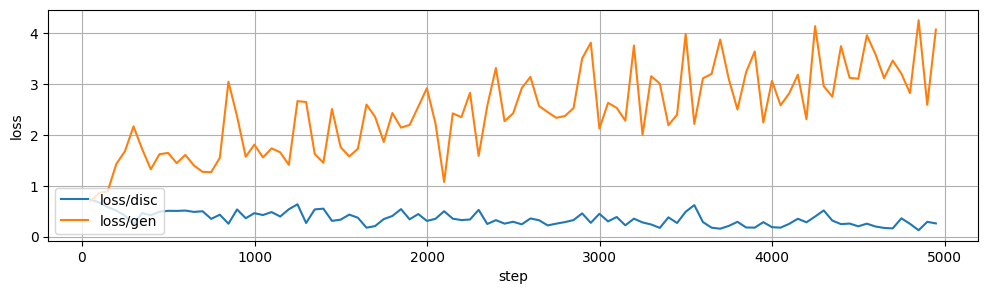

INFO: `Trainer.fit` stopped: `max_epochs=10` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


In [26]:
seed_everything()

batch_size = 32
epochs = 10

train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)

seed_everything()
generator = CGenerator()
discriminator = CDiscriminator()

pl_model = CGAN(
    generator, discriminator
)
trainer = L.Trainer(
    max_epochs=epochs,
    logger=L.pytorch.loggers.TensorBoardLogger(save_dir="./z2/gals"),
)

trainer.fit(model=pl_model, train_dataloaders=train_loader)

## Тест

Рассчитайте  `InceptionScore` для отложенной (тестовой) выборки и сгенерированных данных.

**Совет:** обратите внимание, что генератор возвращает данные от 0 до 1 (денормализация не требуется). При написании датасета, чтобы данные были в одном диапазоне и не нужно было проводить нормализацию-денормализацию, можно убрать нормализацию из преобразований.

In [27]:
print(f"{test_data.dataset.transform=}")

test_data.dataset.transform=Compose(
      ToImage()
      ToDtype(scale=True)
)


In [28]:
from torchmetrics.image.inception import InceptionScore

class RunMetric(L.LightningModule):
    def __init__(self, generator, noise_function=torch.randn, latent_dim=10):
        super().__init__()
        # model
        self.generator = generator
        self.noise_function = noise_function
        self.latent_dim = latent_dim
        # metrics
        self.is_real = InceptionScore()
        self.is_fake = InceptionScore()

    def test_step(self, batch, batch_idx):
        real,labels = batch
        noise = self.noise_function((real.shape[0], self.latent_dim),
            dtype=torch.float32,
        ).to(self.device)
        fake = self.generator(noise,labels)

        real = (real * 255).type(torch.uint8)
        fake = (fake * 255).type(torch.uint8)

        self.fake = fake


        self.is_real.update(real)
        self.is_fake.update(fake)




    def on_test_epoch_end(self):
        is_real = self.is_real.compute()[0]
        self.log("IS_real", is_real.item())
        self.is_real.reset()

        is_fake = self.is_fake.compute()[0]
        self.log("IS_fake", is_fake.item())
        self.is_fake.reset()

        fig, ax = plt.subplots(figsize=(16 * 3, 2 * 3))
        ax.imshow(
            make_grid(self.fake).permute(1, 2, 0).cpu().numpy(),
            interpolation="nearest",
            aspect="equal",
        )
        ax.axis("off")
        plt.show()

INFO: Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
INFO:lightning.pytorch.utilities.rank_zero:Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

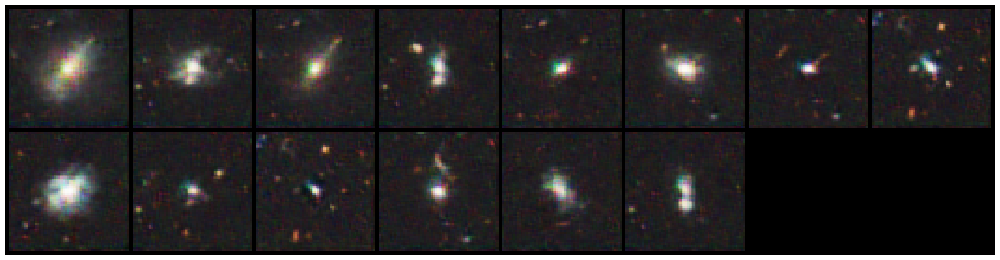

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│          IS_fake          │    1.4869118928909302     │
│          IS_real          │    1.9053153991699219     │
└───────────────────────────┴───────────────────────────┘

In [29]:
metric_model = RunMetric(pl_model.generator)
clear_output()
test_loader = DataLoader(test_data, batch_size=batch_size, shuffle=False)
trainer = L.Trainer(max_epochs=0)
metrics = trainer.test(model=metric_model, dataloaders=test_loader)

Является ли  `InceptionScore` “из коробки” хорошей метрикой для датасета Galaxy10? Что можно сделать для улучшения метрики?

**Напишите вывод** с ответом на вопросы выше:

По результатам видно, что реальные изображения получили более высокий Inception Score. Генератор не достиг реалистичности настоящих данных. Но Inception Score основывается на предсказаниях Inception v3, обученной на ImageNet. А в ImageNet нет астрономических объектов. Поэтому эта метрика не отражает разнообразие и реалистичность данных.

Можно дообучить Inception v3 на нашем датасете и использовать новую модель для получения метрики.

In [33]:
from torchmetrics import MetricCollection
from torchmetrics.classification import (
    MulticlassAccuracy,
    MulticlassF1Score,
    MulticlassAUROC,
)
class LModel(L.LightningModule):
    def __init__(self, model, lr=0.001,optimizer_cls=torch.optim.AdamW):
        super().__init__()
        self.save_hyperparameters(logger=False, ignore=["model"])
        self.lr = lr
        self.model = model
        self.criterion = nn.CrossEntropyLoss()
        metrics = MetricCollection([
            MulticlassAccuracy(num_classes=10,),
            # MulticlassF1Score(num_classes=100,),

        ])
        self.train_metrics = metrics.clone(postfix="/train")
        self.val_metrics = metrics.clone(postfix="/val")
        self.test_metrics = metrics.clone(postfix="/test")
        self.optimizer_cls = optimizer_cls

    def configure_optimizers(self):
        optimizer = self.optimizer_cls(
            self.model.parameters(),
            lr=self.lr,
        )
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
            optimizer,
        )
        return {
            "optimizer": optimizer,
            "lr_scheduler": {
                "scheduler": scheduler,
                "interval": "epoch",
                "monitor": "loss"
            },
        }

    def training_step(self, batch, batch_idx):
        x,y = batch
        out = self.model(x)
        loss = self.criterion(out, y)
        self.train_metrics.update(out, y)
        self.log("loss", loss, prog_bar=True)
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        self.val_metrics.update(out, y)

    def on_train_epoch_end(self):
        self.log_dict(self.train_metrics.compute())
        self.train_metrics.reset()

        val_metrics = self.val_metrics.compute()
        self.log_dict(val_metrics)
        self.val_metrics.reset()

    def test_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        self.test_metrics.update(out, y)

    def on_test_epoch_end(self):
        self.log_dict(self.test_metrics.compute())
        self.test_metrics.reset()

In [35]:
img,label = next(iter(train_loader))
print(img.shape)

torch.Size([32, 3, 64, 64])


In [37]:
from torchvision.models import inception_v3
from lightning.pytorch.callbacks import ModelCheckpoint
inception_v3_model = inception_v3(pretrained = False,transform_input=False, aux_logits=False)
inception_v3_model.Conv2d_1a_3x3.conv = nn.Conv2d(
        in_channels=3,
        out_channels=32,
        kernel_size=3,
        stride=1,
        padding=1
    )

inception_v3_model.maxpool1 = nn.Identity()
inception_v3_model.maxpool2 = nn.Identity()
inception_v3_model.fc = nn.Linear(inception_v3_model.fc.in_features, 10)
inception_v3_pl_model = LModel(inception_v3_model,lr=1e-4)
trainer = L.Trainer(
      max_epochs=10,
      num_sanity_val_steps=0,
      log_every_n_steps=10,
      logger=L.pytorch.loggers.TensorBoardLogger(save_dir='inception_v3_for_gals'),
      enable_progress_bar=True,
      precision="16-mixed"
  )
trainer.fit(model = inception_v3_pl_model,train_dataloaders=train_loader)

INFO: Using 16bit Automatic Mixed Precision (AMP)
INFO:lightning.pytorch.utilities.rank_zero:Using 16bit Automatic Mixed Precision (AMP)
INFO: Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
INFO:lightning.pytorch.utilities.rank_zero:Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_D

Training: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: The ``compute`` method of metric MulticlassAccuracy was called before the ``update`` method which may lead to errors, as metric states have not yet been updated.
  warnings.warn(*args, **kwargs)
INFO: `Trainer.fit` stopped: `max_epochs=10` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


In [64]:
from torchmetrics import Metric
import torch.nn.functional as F

class CustomInceptionScore(Metric):
    def __init__(self, splits=10, resize=True, device='cuda'):
        super().__init__()

        self.splits = splits
        self.transform = normalize
        self._device = device
        self.inception = inception_v3_pl_model.model
        self.inception.eval().to(device)
        for param in self.inception.parameters():
            param.requires_grad = False
        self.add_state("logits", default=[], dist_reduce_fx="cat")
        self.add_state("preds", default=[], dist_reduce_fx=None)

    def update(self, images: torch.Tensor):
        if images.shape[1] == 1:
            images = images.repeat(1, 3, 1, 1)

        images = torch.stack([self.transform(img) for img in images])
        with torch.no_grad():
            preds = self.inception(images.to(self._device))
            preds = F.softmax(preds, dim=1)
        self.logits.append(preds.cpu())
        self.preds.append(preds.detach().cpu())

    def compute(self):
      preds = torch.cat(self.preds, dim=0).cpu().numpy()
      N = preds.shape[0]
      split_scores = []

      for k in range(self.splits):
          part = preds[k * (N // self.splits): (k + 1) * (N // self.splits)]
          part_tensor = torch.from_numpy(part)
          py = part_tensor.mean(dim=0)
          scores = [torch.sum(p * (torch.log(p) - torch.log(py))) for p in part_tensor]
          split_scores.append(torch.exp(torch.mean(torch.stack(scores))))

      return torch.mean(torch.stack(split_scores))

    def reset(self):
        self.logits = []
        self.preds = []

class RunMetric_custom(L.LightningModule):
    def __init__(self, generator, noise_function=torch.randn, latent_dim=10):
        super().__init__()
        # model
        self.generator = generator
        self.noise_function = noise_function
        self.latent_dim = latent_dim
        # metrics
        self.is_real = CustomInceptionScore()
        self.is_fake = CustomInceptionScore()

    def test_step(self, batch, batch_idx):
        real,labels = batch
        noise = self.noise_function((real.shape[0], self.latent_dim),
            dtype=torch.float32,
        ).to(self.device)
        fake = self.generator(noise,labels)

        self.labels = labels

        self.real = real
        fake = fake

        self.fake = fake


        self.is_real.update(real)
        self.is_fake.update(fake)




    def on_test_epoch_end(self):
        is_real = self.is_real.compute()
        self.log("IS_real", is_real.item())
        self.is_real.reset()

        is_fake = self.is_fake.compute()
        self.log("IS_fake", is_fake.item())
        self.is_fake.reset()

        num_images = min(16, self.fake.size(0))
        images = self.fake[:num_images]
        labels = self.labels[:num_images].cpu().numpy()

        cols = 4
        rows = (num_images + cols - 1) // cols

        fig, axs = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))
        axs = axs.flatten()

        for i in range(num_images):
            img = images[i]
            img = (img * 255).type(torch.uint8).permute(1, 2, 0).cpu().numpy()
            axs[i].imshow(img)
            axs[i].set_title(f"Label: {labels[i]}")
            axs[i].axis("off")

        for j in range(num_images, len(axs)):
            axs[j].axis("off")

        plt.tight_layout()
        fig.suptitle('Fake', fontsize=16)
        plt.show()
        num_images = min(16, self.fake.size(0))
        images = self.real[:num_images]
        labels = self.labels[:num_images].cpu().numpy()

        cols = 4
        rows = (num_images + cols - 1) // cols

        fig, axs = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))
        axs = axs.flatten()

        for i in range(num_images):
            img = images[i]
            img = (img * 255).type(torch.uint8).permute(1, 2, 0).cpu().numpy()
            axs[i].imshow(img)
            axs[i].set_title(f"Label: {labels[i]}")
            axs[i].axis("off")

        for j in range(num_images, len(axs)):
            axs[j].axis("off")

        fig.suptitle('Real', fontsize=16)
        plt.tight_layout()
        plt.show()


INFO: Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
INFO:lightning.pytorch.utilities.rank_zero:Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

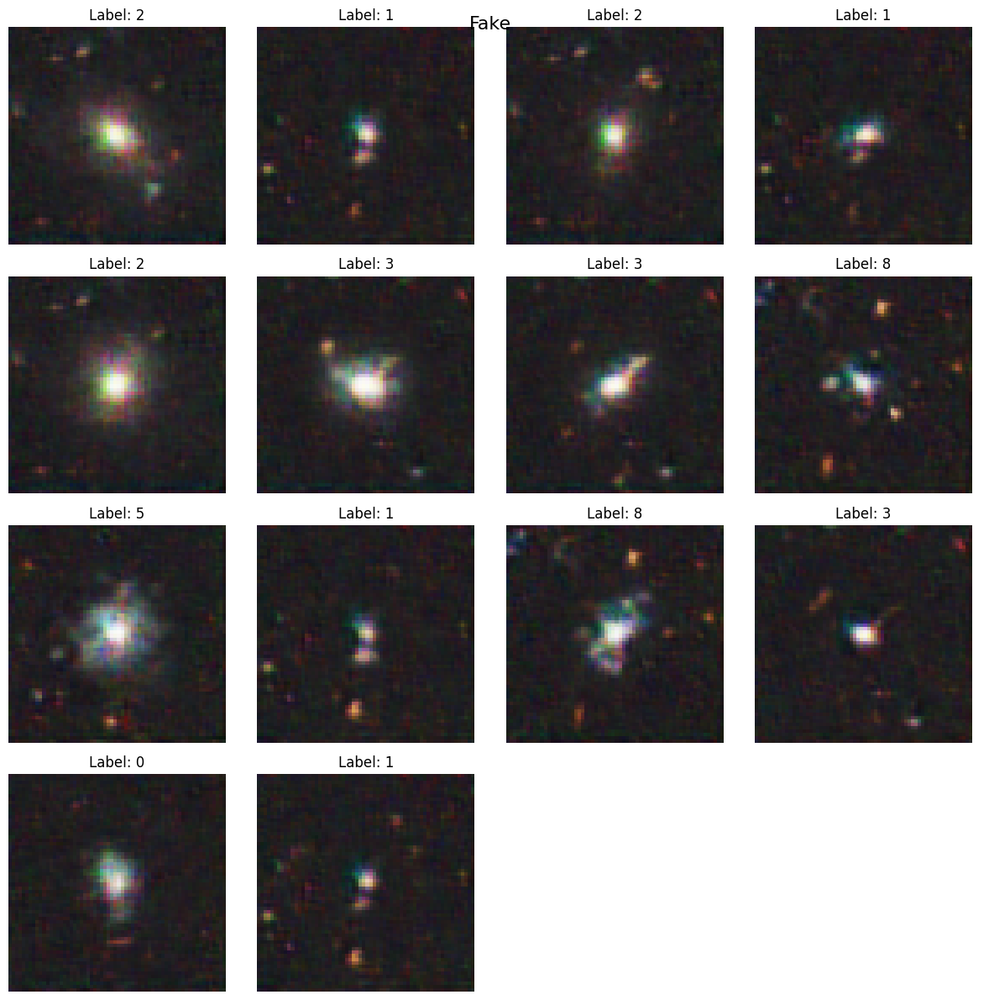

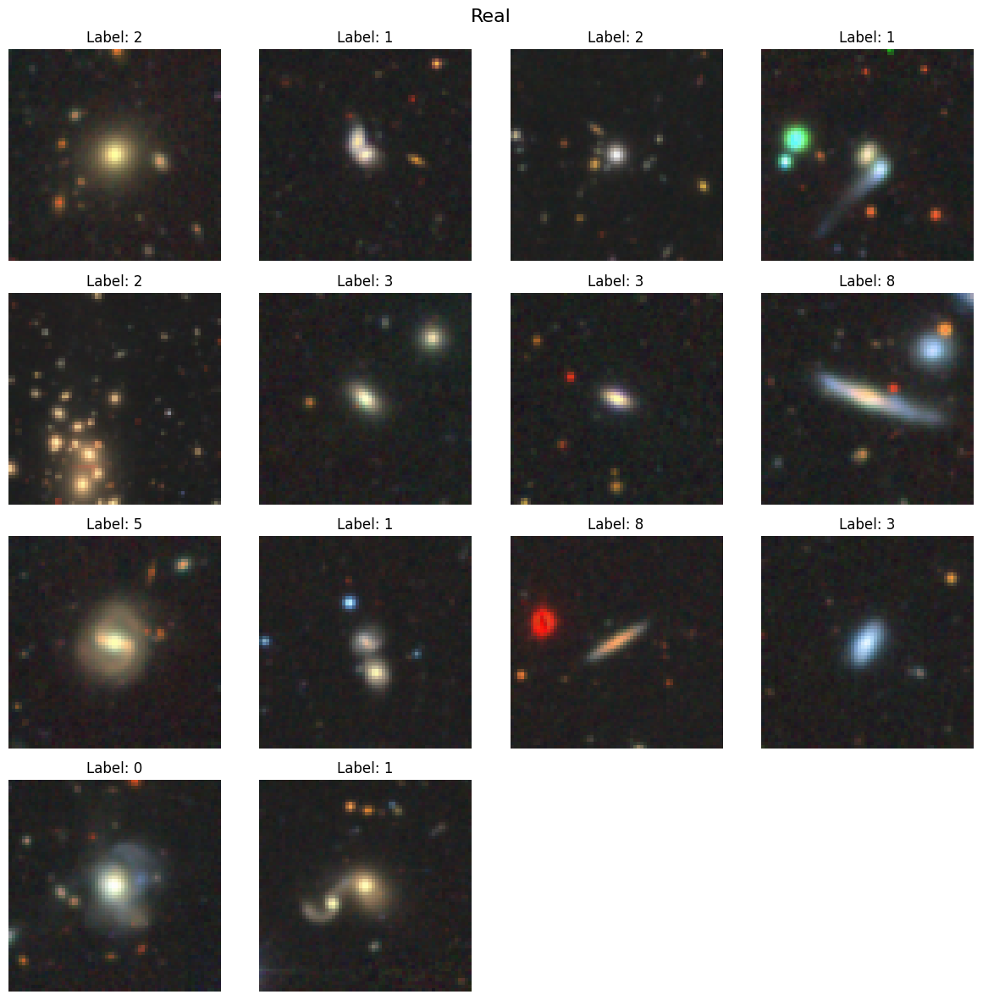

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│          IS_fake          │     1.995083212852478     │
│          IS_real          │     5.017969131469727     │
└───────────────────────────┴───────────────────────────┘

In [65]:
metric_model = RunMetric_custom(pl_model.generator)
clear_output()
test_loader = DataLoader(test_data, batch_size=batch_size, shuffle=False)
trainer = L.Trainer(max_epochs=0)
metrics = trainer.test(model=metric_model, dataloaders=test_loader)

По полученному уже кастомному значению Inception score сгенерированные изображения менее разнообразные и хуже распознаются по сравнению с реальными данными. Также c использованием обученной на галактиках Inception-v3 значения метрик между реальными и сгенерированными данными больше отличаются, чем при использовании реализации из коробки. И, наверное, такая метрика будет больше соответсвовать дейтсвительности, чем реализация из коробки.

## Генерация

Напоследок выведем сгенерированные и реальные изображения галактик каждого класса:

In [30]:
labels = torch.arange(10)

noises = pl_model.noise_function(
    (10, pl_model.latent_dim),
    dtype=torch.float32,
)


fake_samples = pl_model.generator(noises, labels).detach()
fake_samples = fake_samples.permute(0, 2, 3, 1).numpy()
fake_samples = (fake_samples * 255).astype(int)

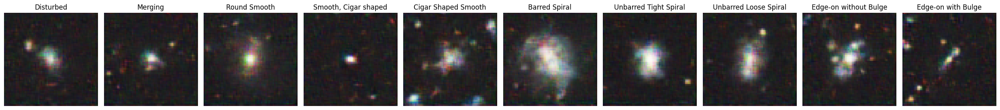

In [31]:
show_samples(fake_samples, class_names)

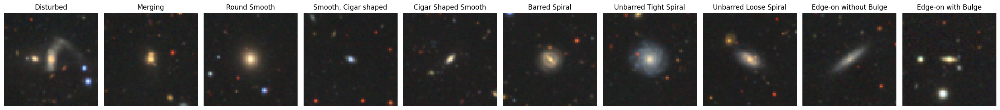

In [32]:
show_samples(real_samples, class_names)

# Задание 3. Условная генерация с помощью диффузионной модели

В ходе лекции мы рассмотрели  безусловную диффузионную модель генерации изображений. В рамках данного задания вам предлагается попробовать сделать модель "условной", то есть научиться генерировать при помощи диффузионных моделей объекты определенного класса.

Существуют различные подходы к добавлению "условия" в диффузионную модель. Реализуем наиболее простой подход, связанный с добавлением метки класса в модель предсказания шума.

## Формат результата

Набор чисел от 0 до 9, сгенерированных моделью.

Пример генерации:

<img src ="https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.4/Exercises/EX13/result_3_task_ex13.png" width="500">

Установка и импорт необходимых библиотек:

In [ ]:
!pip install -q accelerate diffusers

In [ ]:
import torch
import torchvision
import os

from pathlib import Path
from dataclasses import dataclass
from torchvision import transforms
from torch import nn
from torch.utils.data import DataLoader
from diffusers import DDPMScheduler, UNet2DModel
from matplotlib import pyplot as plt
from accelerate import Accelerator
from tqdm.auto import tqdm

from diffusers import DDPMPipeline
from diffusers.utils import make_image_grid

## Датасет

Диффузионные модели требуют большого количества вычислительных ресурсов для обучения. Попробуем решить задачу, используя в качестве датасета сравнительно простой MNIST:


  0%|          | 0.00/9.91M [00:00<?, ?B/s]
100%|██████████| 9.91M/9.91M [00:00<00:00, 56.0MB/s]

100%|██████████| 28.9k/28.9k [00:00<00:00, 3.28MB/s]

100%|██████████| 1.65M/1.65M [00:00<00:00, 16.8MB/s]

100%|██████████| 4.54k/4.54k [00:00<00:00, 6.03MB/s]


Input shape: torch.Size([8, 1, 28, 28])
Labels: tensor([9, 2, 1, 3, 6, 8, 2, 3])


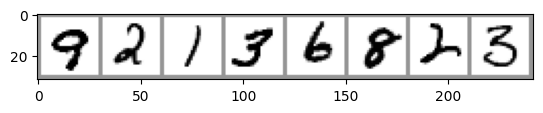

In [ ]:
dataset = torchvision.datasets.MNIST(
    root="mnist/",
    train=True,
    download=True,
    transform=transforms.Compose(
        [
            transforms.ToTensor(),
            transforms.Normalize([0.5], [0.5]),
        ]
    ),
)


# Feed it into a dataloader (batch size 8 here just for demo)
train_dataloader = DataLoader(dataset, batch_size=8, shuffle=True, num_workers=2)

# View some examples
x, y = next(iter(train_dataloader))
print("Input shape:", x.shape)
print("Labels:", y)
plt.imshow(torchvision.utils.make_grid(x)[0], cmap="Greys")
plt.show()

## Конфигурация обучения

Зададим базовые конфигурации обучения: будем использовать оптимизатор Adam без планировщика скорости обучения. Наша цель не в том, чтобы получить идеальное изображение, а в том, чтобы научиться работать с условной диффузионной моделью за короткое время, поэтому советуем взять $\text{lr} = 10^{-3}$ и 7 эпох обучения.

In [ ]:
from dataclasses import dataclass


@dataclass
class TrainingConfig:
    image_size = 28  # the generated image resolution
    train_batch_size = 64
    eval_batch_size = 100  # how many images to sample during evaluation
    num_epochs = 7
    learning_rate = 1e-3
    save_image_epochs = 7
    save_model_epochs = 7
    mixed_precision = "fp16"  # "no" for float32, "fp16" for automatic mixed precision
    output_dir = "ddpm-mnist-28"  # the model name locally and on the HF Hub
    seed = 42
    push_to_hub = False


config = TrainingConfig()

## Создание модели и планировщика зашумления

В этом задании рекомендуется использовать класс модели `UNet2DModel` [🛠️[doc]](https://huggingface.co/docs/diffusers/api/models/unet2d), который мы использовали в лекции. При желании можно также использовать класс `UNet2DConditionModel` [🛠️[doc]](https://huggingface.co/docs/diffusers/api/models/unet2d-cond) — у него больше параметров настройки, он более гибкий и его код проще модифицировать.

В качестве эмбеддинга будем использовать обучаемый `nn.Embedding` [🛠️[doc]](https://github.com/huggingface/diffusers/blob/c586aadef6bb66d355fa40a2b95a0bea8a6fe79c/src/diffusers/models/unets/unet_2d.py#L156) (рекомендуем перейти по ссылке и посмотреть код), который будет суммироваться с эмбеддингом шага зашумления $t$. Для этого нужно передать параметры:
```python
class_embed_type=None,
num_class_embeds=10
```

По структуре модели: для экономии времени рекомендуем использовать 3 блока понижения размерности с количеством выходных каналов 32, 32, 64. Механизм Attention целесообразно применять ближе к середине модели.

In [ ]:
model = UNet2DModel(
    sample_size = 28,
    in_channels = 1,
    out_channels=1,
    layers_per_block=2,
    block_out_channels=(32,32,64),
    down_block_types=(
        "DownBlock2D",
        "DownBlock2D",
        "DownBlock2D",
    ),
    up_block_types=(
        "UpBlock2D",
        "UpBlock2D",
        "UpBlock2D",
    ),
    add_attention=True,
    num_class_embeds=10,
    class_embed_type=None
)

Распечатаем архитектуру:

In [ ]:
print(model)

UNet2DModel(
  (conv_in): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): Linear(in_features=32, out_features=128, bias=True)
    (act): SiLU()
    (linear_2): Linear(in_features=128, out_features=128, bias=True)
  )
  (class_embedding): Embedding(10, 128)
  (down_blocks): ModuleList(
    (0-1): 2 x DownBlock2D(
      (resnets): ModuleList(
        (0-1): 2 x ResnetBlock2D(
          (norm1): GroupNorm(32, 32, eps=1e-05, affine=True)
          (conv1): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (time_emb_proj): Linear(in_features=128, out_features=32, bias=True)
          (norm2): GroupNorm(32, 32, eps=1e-05, affine=True)
          (dropout): Dropout(p=0.0, inplace=False)
          (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (nonlinearity): SiLU()
        )
      )
      (downsamplers): ModuleList(
        (0): Down

Создайте планировщик обучения (рекомендуется использовать косинусное расписание).

In [ ]:
noise_scheduler = DDPMScheduler(
    num_train_timesteps=1000,
    beta_schedule="squaredcos_cap_v2",
    prediction_type="epsilon",
)

## Обучение модели

Здесь вам предлагается взять код из лекции, убрать планировщик скорости и адаптировать его к условной генерации.

In [ ]:
criterion = nn.MSELoss()

train_dataloader = torch.utils.data.DataLoader(
    dataset, batch_size=config.train_batch_size, shuffle=True, num_workers=2
)

optimizer = torch.optim.AdamW(model.parameters(), lr=config.learning_rate)

In [ ]:
def evaluate(config, epoch, pipeline):
    # Sample some images from random noise (this is the backward diffusion process).
    # The default pipeline output type is `List[PIL.Image]`

    class_labels = (
        torch.tensor([[i] * (config.eval_batch_size // 10) for i in range(10)])
        .flatten()
        .to(pipeline.device)
    )

    x = torch.randn(config.eval_batch_size, 1, 28, 28).to(pipeline.device)

    # Sampling loop
    for i, t in tqdm(enumerate(pipeline.scheduler.timesteps)):

        # Get model pred
        with torch.no_grad():
            residual = pipeline.unet(x, t, class_labels, return_dict=False)[
                0
            ]  # Again, note that we pass in our labels y

        # Update sample with step
        x = pipeline.scheduler.step(residual, t, x).prev_sample

    # Show the results
    fig, ax = plt.subplots(1, 1)
    ax.imshow(
        torchvision.utils.make_grid(
            x.detach().cpu().clip(-1, 1), nrow=config.eval_batch_size // 10
        )[0],
        cmap="Greys",
    )
    ax.axis("off")

In [ ]:
from huggingface_hub import create_repo, upload_folder
from diffusers.optimization import get_cosine_schedule_with_warmup


def train_loop(
    config,
    model,
    noise_scheduler,
    optimizer,
    train_dataloader,
):
    lr_scheduler = get_cosine_schedule_with_warmup(
    optimizer=optimizer,
    num_warmup_steps=len(train_dataloader),
    num_training_steps=2
    * (
        len(train_dataloader) * config.num_epochs
    ),
    )
    accelerator = Accelerator(
          mixed_precision=config.mixed_precision,
          log_with="tensorboard",
          project_dir=os.path.join(config.output_dir, "logs"),
      )
    if accelerator.is_main_process:
        if config.output_dir is not None:
            os.makedirs(config.output_dir, exist_ok=True)
        if config.push_to_hub:
            repo_id = create_repo(
                repo_id=config.hub_model_id or Path(config.output_dir).name,
                exist_ok=True,
            ).repo_id
        accelerator.init_trackers("train_example")
    model, optimizer, train_dataloader, lr_scheduler = accelerator.prepare(
        model, optimizer, train_dataloader, lr_scheduler
    )

    global_step = 0
    for epoch in range(config.num_epochs):
        progress_bar = tqdm(
            total=len(train_dataloader), disable=not accelerator.is_local_main_process
        )
        progress_bar.set_description(f"Epoch {epoch}")

        for step, batch in enumerate(train_dataloader):
            clean_images,class_labels = batch
            noise = torch.randn(clean_images.shape, device=clean_images.device)
            bs = clean_images.shape[0]

            timesteps = torch.randint(
                0,
                noise_scheduler.config.num_train_timesteps,
                (bs,),
                device=clean_images.device,
                dtype=torch.int64,

            )
            noisy_images = noise_scheduler.add_noise(clean_images, noise, timesteps)

            with accelerator.accumulate(model):

                noise_pred = model(noisy_images, timesteps,class_labels = class_labels,return_dict=False)[0]
                loss = criterion(noise_pred, noise)
                accelerator.backward(loss)

                accelerator.clip_grad_norm_(model.parameters(), 1.0)
                optimizer.step()
                lr_scheduler.step()
                optimizer.zero_grad()

            progress_bar.update(1)
            logs = {
                "loss": loss.detach().item(),
                "lr": lr_scheduler.get_last_lr()[0],
                "step": global_step,
            }
            progress_bar.set_postfix(**logs)
            accelerator.log(logs, step=global_step)
            global_step += 1
        if accelerator.is_main_process:
            pipeline = DDPMPipeline(
                unet=accelerator.unwrap_model(model), scheduler=noise_scheduler
            )

            if (
                epoch + 1
            ) % config.save_image_epochs == 0 or epoch == config.num_epochs - 1:
                evaluate(config, epoch, pipeline)

            if (
                epoch + 1
            ) % config.save_model_epochs == 0 or epoch == config.num_epochs - 1:
                if config.push_to_hub:
                    upload_folder(
                        repo_id=repo_id,
                        folder_path=config.output_dir,
                        commit_message=f"Epoch {epoch}",
                        ignore_patterns=["step_*", "epoch_*"],
                    )
                else:
                    pipeline.save_pretrained(config.output_dir)





Будем визуализировать процесс обучения с TensorBoard:

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/ddpm-mnist-28 --port 6006

Output hidden; open in https://colab.research.google.com to view.

Обучим модель:

Launching training on one GPU.


  0%|          | 0/938 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

0it [00:00, ?it/s]

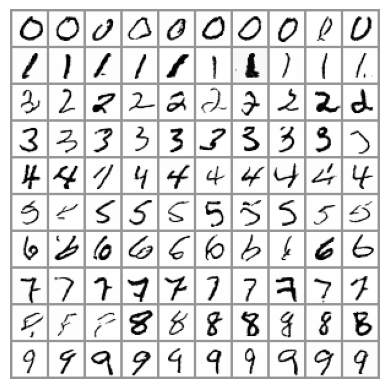

In [ ]:
from accelerate import notebook_launcher


args = (
    config,
    model,
    noise_scheduler,
    optimizer,
    train_dataloader,
)

notebook_launcher(train_loop, args, num_processes=1)

## Дополнительно

Можете попробовать генерацию text2image с помощью библиотеки [Diffusers 🛠️[doc]](https://huggingface.co/docs/diffusers/index) и порадовать преподавателя результатами генерации.

In [ ]:
from diffusers import DiffusionPipeline
device = "cuda" if torch.cuda.is_available() else "cpu"

pipeline = DiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", use_safetensors=True
)

clear_output()

  0%|          | 0/50 [00:00<?, ?it/s]

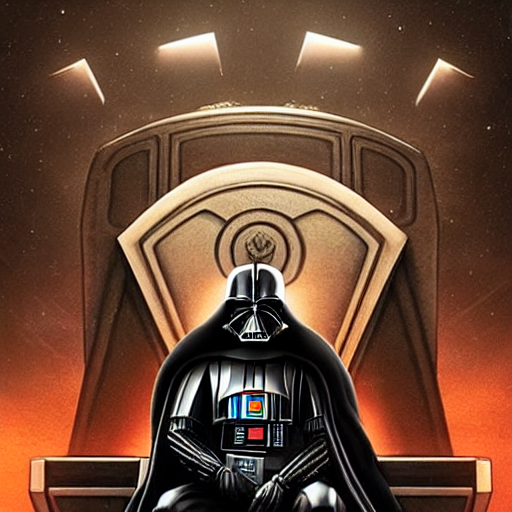

In [ ]:
torch.manual_seed(42)

pipeline.to(device)

image = pipeline("An image of Grogu turned to dark-side, he rules galactic empire now and sits on the throne").images[0]
image

  0%|          | 0/50 [00:00<?, ?it/s]

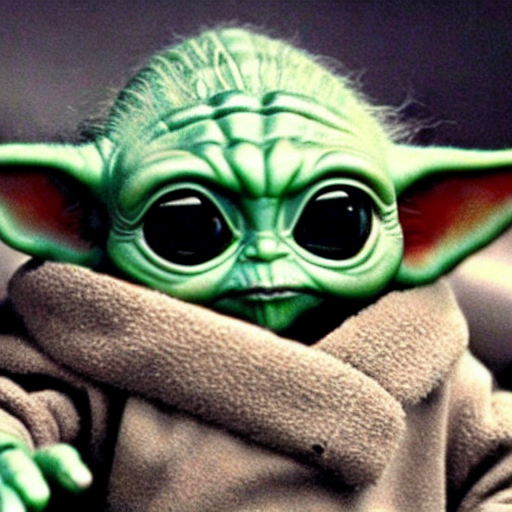

In [ ]:
image = pipeline("An image of baby Yoda turned to dark-side, he rules galactic empire now and sits on the throne, in front of him we can see empire's army and on the background two imperial star destroyers").images[0]
image

  0%|          | 0/50 [00:00<?, ?it/s]

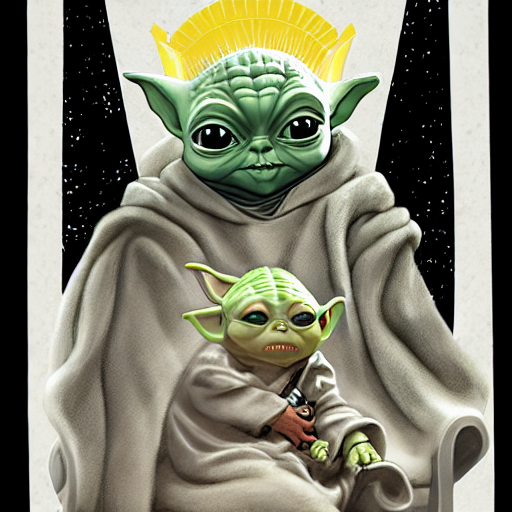

In [ ]:
image = pipeline("An image of baby Yoda ruling galactic empire now and sitting on the throne, in front of him we can see empire's army and on the background two imperial star destroyers").images[0]
image

In [ ]:
from diffusers import StableDiffusionXLPipeline

pipeline = StableDiffusionXLPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    torch_dtype=torch.float16
)
clear_output()
torch.manual_seed(42)

pipeline.to(device)

image = pipeline('''
A majestic scene of Baby Yoda (Grogu) sitting confidently on a grand imperial throne, wearing royal robes and a crown, ruling the vast Galactic Empire.
In front of him stands a formidable army of imperial stormtroopers in perfect formation.
Behind, two massive Imperial Star Destroyers loom dramatically in the sky under a dark starry galaxy.
Cinematic lighting, ultra-detailed, epic sci-fi fantasy, concept art, highly realistic, 8K resolution, dramatic shadows and highlights.
''').images[0]
image

Output hidden; open in https://colab.research.google.com to view.